In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import sys
import itertools
import seaborn as sns
from tqdm.notebook import tqdm

In [30]:
tol_bright = ["#4477AA","#EE6677","#228833","#CCBB44","#66CCEE","#AA3377","#BBBBBB"]
stylemap = {
    "MOLE": {
        "color": tol_bright[0],
        "linestyle": "solid",
        "label": "MOLE"},
    "omnioptimizer": {
        "color": tol_bright[1],
        "linestyle": "dashed",
        "label": "Omni-Optimizer"},
    "NSGA-II": {
        "color": tol_bright[2],
        "linestyle": "dashdot",
        "label": "NSGA-II"},
    "SMS-EMOA": {
        "color": tol_bright[3],
        "linestyle": "dotted",
        "label": "SMS-EMOA"},
}

config_order = ["default", "config-HVN", "config-SP", "config-ABSEHVMEANNORM", "config-ABSECUMHVMEANNORM", "config-ABSECUMHVAUCMEANNORM"]
target_order = ["HV", "SP", "ABSEHVMEAN", "ABSECUMHVMEAN", "ABSECUMHVAUCMEAN"]

import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

#matplotlib.use("pgf")
matplotlib.rcParams.update({
    #"pgf.texsystem": "pdflatex",
    'font.family': 'serif',
    #'text.usetex': True,
    #'pgf.rcfonts': False,
})

In [60]:
df = pd.read_csv("../05lofconfiguration/results.csv")
df = df.sort_values(["instance","solver"])

df = df.drop("Unnamed: 0", axis=1)
for col in ["solver","instance"]:
    df = df[[col] + [v for v in df.columns if v != col]]
df["basesolver"] = [sol.split("_")[0] for sol in df["solver"]]
df = df[df[["HV"]].isna().sum(1) == 0]

In [61]:
display(df.head(5))
display(df["solver"].unique())
display(df["instance"].unique())

,instance,solver,run,seed,HV,HVN,SP,ABSEHVMEAN,ABSEHVMEANNORM,ABSEHVAUCMEAN,ABSEHVAUCMEANNORM,ABSEHVAUCB1,ABSECUMHVMEAN,ABSECUMHVMEANNORM,ABSECUMHVAUCMEAN,ABSECUMHVAUCMEANNORM,ABSECUMHVAUCB1,configuration,basesolver
8579,BiObjBBOB1,MOLE_ABSECUMHVAUCMEANNORM,0.0,2733.0,4.384190e+06,0.989643,9.066425,1.724802e+06,0.389339,3.532209e+10,7973.251281,4.951465e+10,4.340259e+06,0.979726,1.080386e+11,24387.537024,1.095821e+11,-descent_armijo_factor '0.09333617355203522' -...,MOLE
8580,BiObjBBOB1,MOLE_ABSECUMHVAUCMEANNORM,1.0,43568.0,4.367981e+06,0.985984,8.475930,0.000000e+00,0.000000,3.158023e+10,7128.600665,4.112535e+10,4.340397e+06,0.979757,1.069569e+11,24143.377476,1.094920e+11,-descent_armijo_factor '0.09333617355203522' -...,MOLE
8581,BiObjBBOB1,MOLE_ABSECUMHVAUCMEANNORM,2.0,42614.0,4.400863e+06,0.993406,8.801538,2.527772e+06,0.570594,3.564634e+10,8046.444066,5.267006e+10,4.341272e+06,0.979955,1.067214e+11,24090.196972,1.095277e+11,-descent_armijo_factor '0.09333617355203522' -...,MOLE
8582,BiObjBBOB1,MOLE_ABSECUMHVAUCMEANNORM,3.0,52417.0,4.384832e+06,0.989787,10.847817,0.000000e+00,0.000000,3.083873e+10,6961.223169,4.680877e+10,4.341039e+06,0.979902,1.061760e+11,23967.086671,1.065144e+11,-descent_armijo_factor '0.09333617355203522' -...,MOLE
8583,BiObjBBOB1,MOLE_ABSECUMHVAUCMEANNORM,4.0,45892.0,4.397586e+06,0.992666,6.397304,8.583609e+05,0.193758,3.273601e+10,7389.495735,4.050783e+10,4.341416e+06,0.979987,1.071014e+11,24175.988596,1.090832e+11,-descent_armijo_factor '0.09333617355203522' -...,MOLE


array(['MOLE_ABSECUMHVAUCMEANNORM', 'MOLE_ABSECUMHVMEANNORM',
       'MOLE_ABSEHVMEANNORM', 'MOLE_HVN', 'MOLE_SP',
       'NSGA-II_ABSECUMHVAUCMEANNORM', 'NSGA-II_ABSECUMHVMEANNORM',
       'NSGA-II_ABSEHVMEANNORM', 'NSGA-II_HVN', 'NSGA-II_SP',
       'SMS-EMOA_ABSECUMHVAUCMEANNORM', 'SMS-EMOA_ABSECUMHVMEANNORM',
       'SMS-EMOA_ABSEHVMEANNORM', 'SMS-EMOA_HVN', 'SMS-EMOA_SP',
       'omnioptimizer_ABSECUMHVAUCMEANNORM',
       'omnioptimizer_ABSECUMHVMEANNORM', 'omnioptimizer_ABSEHVMEANNORM',
       'omnioptimizer_HVN', 'omnioptimizer_SP'], dtype=object)

array(['BiObjBBOB1', 'BiObjBBOB2', 'BiObjBBOB3', 'BiObjBBOB4',
       'BiObjBBOB5', 'DTLZ1', 'DTLZ2', 'DTLZ3', 'DTLZ4', 'DTLZ5', 'DTLZ6',
       'DTLZ7', 'MMF1', 'MMF10', 'MMF11', 'MMF12', 'MMF14', 'MMF14a',
       'MMF15', 'MMF15a', 'MMF1e', 'MMF1z', 'MMF2', 'MMF3', 'MMF4',
       'MMF5', 'MMF6', 'MMF7', 'MMF8', 'MMF9', 'ZDT1', 'ZDT2', 'ZDT3',
       'ZDT4', 'ZDT6'], dtype=object)

HV         SP  \
instance   solver                                                        
BiObjBBOB1 MOLE_ABSECUMHVAUCMEANNORM           4.394727e+06   8.144276   
           MOLE_ABSECUMHVMEANNORM              4.396809e+06   9.207311   
           MOLE_ABSEHVMEANNORM                 4.327201e+06   6.649370   
           MOLE_HVN                            3.962990e+06   4.336738   
           MOLE_SP                             4.402008e+06  11.961470   
...                                                     ...        ...   
ZDT6       omnioptimizer_ABSECUMHVAUCMEANNORM  2.169912e+01   1.549283   
           omnioptimizer_ABSECUMHVMEANNORM     2.175274e+01   1.477102   
           omnioptimizer_ABSEHVMEANNORM        2.166402e+01   1.381907   
           omnioptimizer_HVN                   2.173756e+01   1.474772   
           omnioptimizer_SP                    2.180458e+01   1.939596   

                                                  $BBE(HV)$  $BBE^{cum}(HV)$  \
instance   solver                                                              
BiObjBBOB1 MOLE_ABSECUMHVAUCMEANNORM           1.376085e+06     4.341105e+06   
           MOLE_ABSECUMHVMEANNORM              1.376858e+06     4.340923e+06   
           MOLE_ABSEHVMEANNORM                 1.731795e+05     4.335285e+06   
           MOLE_HVN                            7.241412e+05     2.291421e+06   
           MOLE_SP                             1.646665e+06     4.340870e+06   
...                                                     ...              ...   
ZDT6       omnioptimizer_ABSECUMHVAUCMEANNORM  4.339824e+00     3.702132e+00   
           omnioptimizer_ABSECUMHVMEANNORM     4.350547e+00     3.702707e+00   
           omnioptimizer_ABSEHVMEANNORM        4.332803e+00     3.697903e+00   
           omnioptimizer_HVN                   4.347511e+00     3.702938e+00   
           omnioptimizer_SP                    4.360916e+00     3.459079e+00   

                                               $BBE^{cum,auc}(HV)$  
instance   solver                                                   
BiObjBBOB1 MOLE_ABSECUMHVAUCMEANNORM                  1.066746e+11  
           MOLE_ABSECUMHVMEANNORM                     1.069554e+11  
           MOLE_ABSEHVMEANNORM                        9.527391e+10  
           MOLE_HVN                                   5.508511e+10  
           MOLE_SP                                    1.073951e+11  
...                                                            ...  
ZDT6       omnioptimizer_ABSECUMHVAUCMEANNORM         9.159807e+04  
           omnioptimizer_ABSECUMHVMEANNORM            9.165788e+04  
           omnioptimizer_ABSEHVMEANNORM               9.041048e+04  
           omnioptimizer_HVN                          9.135308e+04  
           omnioptimizer_SP                           8.409056e+04  

[683 rows x 5 columns]

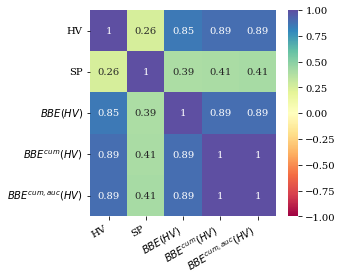

In [62]:
heatmapargs = {"annot": True, "vmin":-1, "vmax":1, "cmap":sns.color_palette("Spectral", as_cmap=True)}
mapper = {"ABSEHVMEAN": "$BBE(HV)$", "ABSECUMHVMEAN": "$BBE^{cum}(HV)$", "ABSECUMHVAUCMEAN": "$BBE^{cum,auc}(HV)$"}
tdf = df.rename(columns=mapper)
metrics = ["HV", "SP", "$BBE(HV)$", "$BBE^{cum}(HV)$", "$BBE^{cum,auc}(HV)$"]
display(tdf.groupby(["instance","solver"])[metrics].mean())
figsize = [6,5]
figsize = [s*0.8 for s in figsize]
fig, ax = plt.subplots(1, figsize=tuple(figsize))  

sns.heatmap(tdf[metrics].corr("spearman"), **heatmapargs)
ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right')
ax.set_aspect('auto')
plt.tight_layout()
plt.savefig(f"figures/spearmancorrelations.pdf")
 

#sns.heatmap(df.groupby(["instance","solver"])[metrics].mean().corr("spearman"), **heatmapargs)
# ax.set_title(f"Correlation plot (all)")
# ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right')
# plt.tight_layout()
# plt.savefig(f"figures/spearmancorrelations.pdf")
# for i, (solver, gdf) in enumerate(df.groupby("basesolver")):
#     metrics = gdf.columns[gdf.columns.isin(["HV", "SP", "ABSEHVMEAN", "ABSECUMHVMEAN", "ABSECUMHVAUCMEAN"])]
#     gdf["ABSECUMHVAUCMEAN"] = gdf["ABSECUMHVAUCMEAN"]
#     fig, ax = plt.subplots(1, figsize=(6, 6))
#     ax.set_aspect('auto')
#     sns.heatmap(gdf[metrics].corr("spearman"), **heatmapargs)
#     ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right')
#     ax.set_title(f"Correlation plot ({solver})")
#     plt.tight_layout()
#     plt.savefig(f"figures/correlations_{solver}.pdf")

In [34]:
df

,instance,solver,run,seed,HV,HVN,SP,ABSEHVMEAN,ABSEHVMEANNORM,ABSEHVAUCMEAN,ABSEHVAUCMEANNORM,ABSEHVAUCB1,ABSECUMHVMEAN,ABSECUMHVMEANNORM,ABSECUMHVAUCMEAN,ABSECUMHVAUCMEANNORM,ABSECUMHVAUCB1,configuration,basesolver
8815,BiObjBBOB1,MOLE_ABSECUMHVAUCMEANNORM,0.0,2733.0,4.426674e+06,0.999232,8.507848,2.539237e+06,0.573182,4.080079e+10,9209.957500,5.881126e+10,4.341271e+06,0.979954,1.074810e+11,24261.676362,1.095685e+11,-descent_armijo_factor '0.07023773375766519' -...,MOLE
8816,BiObjBBOB1,MOLE_ABSECUMHVAUCMEANNORM,1.0,43568.0,4.408768e+06,0.995191,4.878256,1.741510e+06,0.393111,3.829153e+10,8643.542885,5.637979e+10,4.339874e+06,0.979639,1.079486e+11,24367.224322,1.095787e+11,-descent_armijo_factor '0.07023773375766519' -...,MOLE
8817,BiObjBBOB1,MOLE_ABSECUMHVAUCMEANNORM,2.0,42614.0,4.420640e+06,0.997871,6.762595,2.574507e+06,0.581143,4.232570e+10,9554.174240,5.921430e+10,4.340921e+06,0.979876,1.070633e+11,24167.373946,1.086302e+11,-descent_armijo_factor '0.07023773375766519' -...,MOLE
8818,BiObjBBOB1,MOLE_ABSECUMHVAUCMEANNORM,3.0,52417.0,4.395861e+06,0.992277,8.459984,1.731948e+06,0.390952,3.849102e+10,8688.572563,5.420875e+10,4.341490e+06,0.980004,1.072233e+11,24203.498711,1.086363e+11,-descent_armijo_factor '0.07023773375766519' -...,MOLE
8819,BiObjBBOB1,MOLE_ABSECUMHVAUCMEANNORM,4.0,45892.0,4.405096e+06,0.994362,8.595061,1.728513e+06,0.390177,3.974333e+10,8971.256524,5.532524e+10,4.341185e+06,0.979935,1.077674e+11,24326.313927,1.091064e+11,-descent_armijo_factor '0.07023773375766519' -...,MOLE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9685,ZDT6,omnioptimizer_SP,20.0,32231.0,2.156673e+01,1.165174,1.933610,4.313346e+00,0.233035,1.081168e+05,5841.169151,5.405840e+05,3.561142e+00,0.192396,8.474694e+04,4578.578415,4.237347e+05,-delta '0.9733479287246848' -eta_cross '16.516...,omnioptimizer
9686,ZDT6,omnioptimizer_SP,21.0,18984.0,2.154780e+01,1.164151,1.911706,4.309560e+00,0.232830,1.083084e+05,5851.522690,5.415422e+05,3.408497e+00,0.184149,8.294822e+04,4481.399591,4.147411e+05,-delta '0.9733479287246848' -eta_cross '16.516...,omnioptimizer
9687,ZDT6,omnioptimizer_SP,22.0,43096.0,2.160157e+01,1.167056,1.894370,4.320313e+00,0.233411,1.080967e+05,5840.081328,5.404833e+05,3.444655e+00,0.186103,8.365570e+04,4519.622488,4.182785e+05,-delta '0.9733479287246848' -eta_cross '16.516...,omnioptimizer
9688,ZDT6,omnioptimizer_SP,23.0,51375.0,2.197012e+01,1.186968,1.918282,4.394025e+00,0.237394,1.079974e+05,5834.715862,5.399868e+05,3.516381e+00,0.189978,8.561015e+04,4625.214342,4.280507e+05,-delta '0.9733479287246848' -eta_cross '16.516...,omnioptimizer


In [35]:
for solver, gdf in df.groupby("solver"):
    gdf = gdf[gdf["HV"] == 0]
    if len(gdf) == 0:
        continue
    print(solver)
    display(gdf)

In [72]:
display(df.columns)
df[["ABSEHVMEAN","ABSECUMHVMEAN","ABSEJFCUMHVMEAN", "ABSEJFHVMEAN"]]

Index(['instance', 'solver', 'run', 'seed', 'HV', 'HVN', 'SP', 'ABSEHVMEAN',
       'ABSEHVMEANNORM', 'ABSEHVAUCMEAN', 'ABSEHVAUCMEANNORM', 'ABSEHVAUCB1',
       'ABSECUMHVMEAN', 'ABSECUMHVMEANNORM', 'ABSECUMHVAUCMEAN',
       'ABSECUMHVAUCMEANNORM', 'ABSECUMHVAUCB1', 'configuration',
       'basesolver'],
      dtype='object')

KeyError: "['ABSEJFCUMHVMEAN', 'ABSEJFHVMEAN'] not in index"

## Anomalies

In the following cases the hypervolume is 0. Need to investigate why that is and why ABSE.HV.AUC.B1 does have an value. Suspicion: ABSE does use different reference points

In [73]:
df[df["HV"] <= df["ABSEHVMEAN"]]

,instance,solver,run,seed,HV,HVN,SP,ABSEHVMEAN,ABSEHVMEANNORM,ABSEHVAUCMEAN,ABSEHVAUCMEANNORM,ABSEHVAUCB1,ABSECUMHVMEAN,ABSECUMHVMEANNORM,ABSECUMHVAUCMEAN,ABSECUMHVAUCMEANNORM,ABSECUMHVAUCB1,configuration,basesolver


## Decs and Obj visuals

In [74]:
import rpy2.robjects as robjects
import rpy2.robjects.numpy2ri
rpy2.robjects.numpy2ri.activate()

import rpy2.robjects.pandas2ri
rpy2.robjects.pandas2ri.activate()

In [75]:
df = pd.read_csv("./abse_tables.csv")
df = df.sort_values("instance")
df.head(5)

,Unnamed: 0,fun_calls,value_basin1,value_basin2,value_basin3,value_basin4,value_basin5,mean_value,auc_hv_mean,auc_hv1,type,target,instance,solver
395553,395553,300.0,4.360439e+06,4.391488e+06,4.332333e+06,0.0,0.0,2.616852e+06,6.533093e+08,1.086854e+09,absec,ABSECUMHVAUCMEANNORM,BiObjBBOB1,MOLE
350820,350820,600.0,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,abse,default,BiObjBBOB1,MOLE
350819,350819,500.0,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,abse,default,BiObjBBOB1,MOLE
350818,350818,400.0,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,abse,default,BiObjBBOB1,MOLE
350817,350817,300.0,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,abse,default,BiObjBBOB1,MOLE


In [76]:
for a in itertools.product(["abse","absec"], df["target"].unique()):
    print(a)

('abse', 'ABSECUMHVAUCMEANNORM')
('abse', 'default')
('abse', 'HVN')
('abse', 'ABSECUMHVMEANNORM')
('abse', 'ABSEHVMEANNORM')
('abse', 'SP')
('absec', 'ABSECUMHVAUCMEANNORM')
('absec', 'default')
('absec', 'HVN')
('absec', 'ABSECUMHVMEANNORM')
('absec', 'ABSEHVMEANNORM')
('absec', 'SP')


abse ABSECUMHVAUCMEANNORM


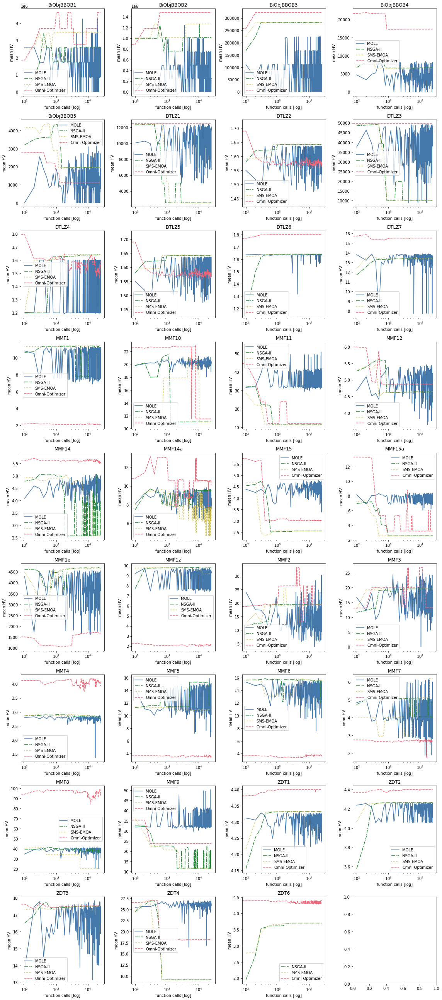

abse default


<Figure size 432x288 with 0 Axes>

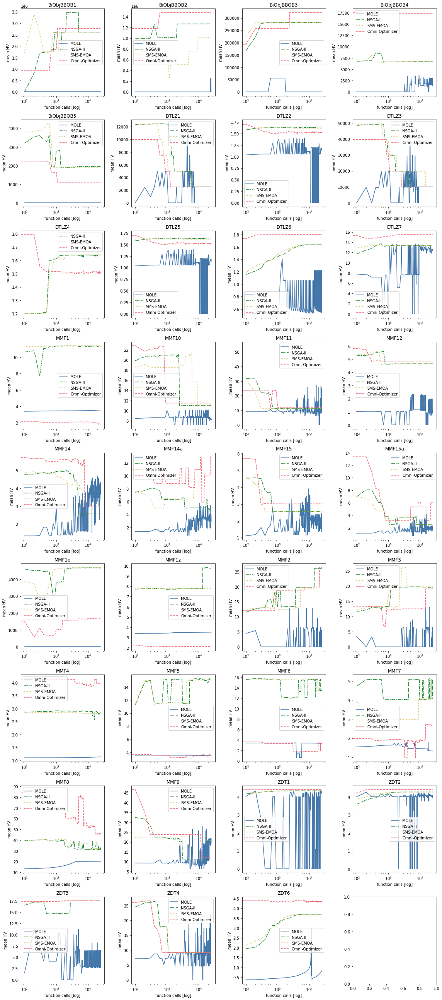

abse HVN


<Figure size 432x288 with 0 Axes>

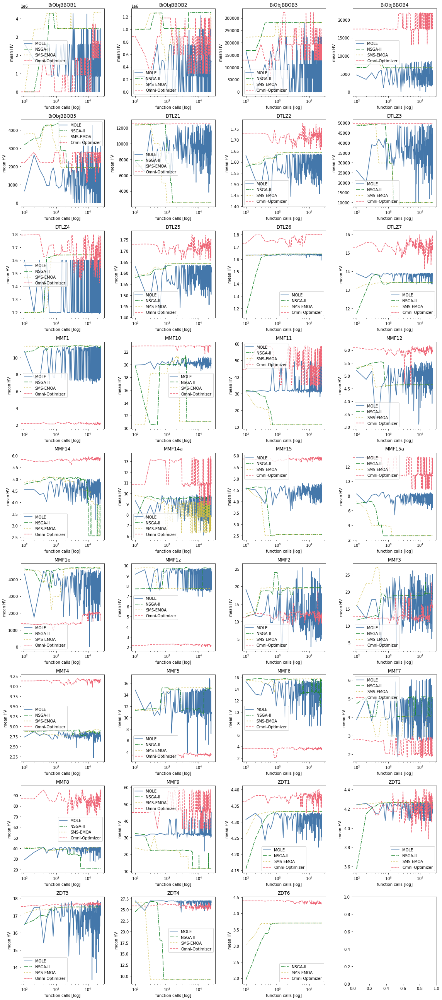

abse ABSECUMHVMEANNORM


<Figure size 432x288 with 0 Axes>

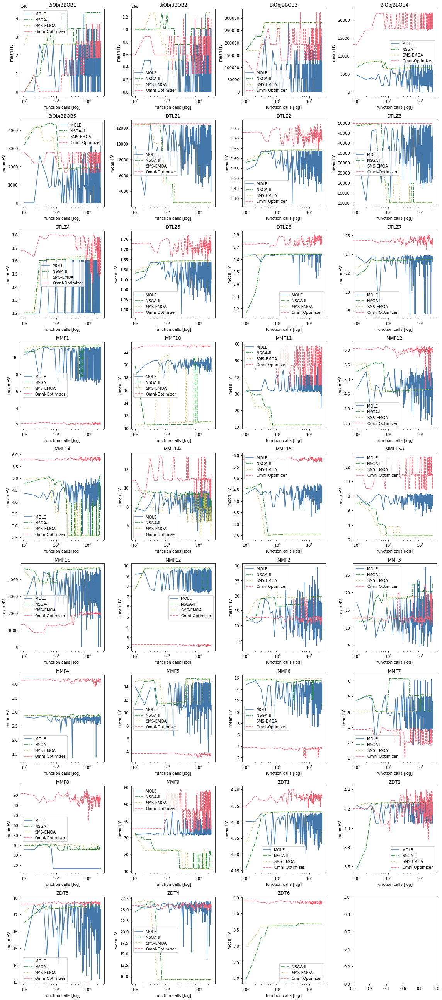

abse ABSEHVMEANNORM


<Figure size 432x288 with 0 Axes>

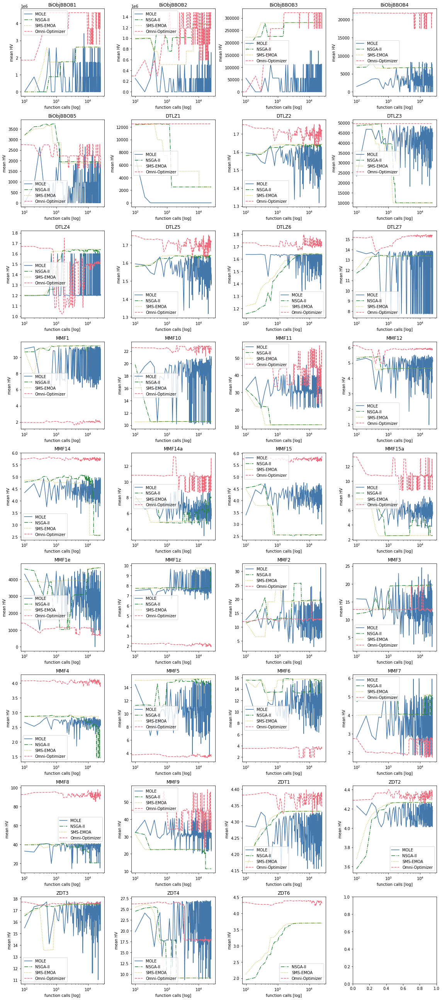

abse SP


<Figure size 432x288 with 0 Axes>

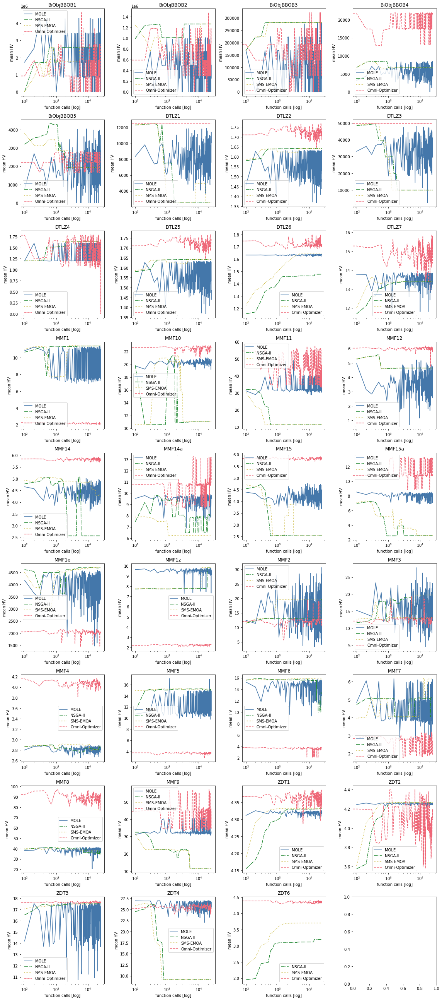

absec ABSECUMHVAUCMEANNORM


<Figure size 432x288 with 0 Axes>

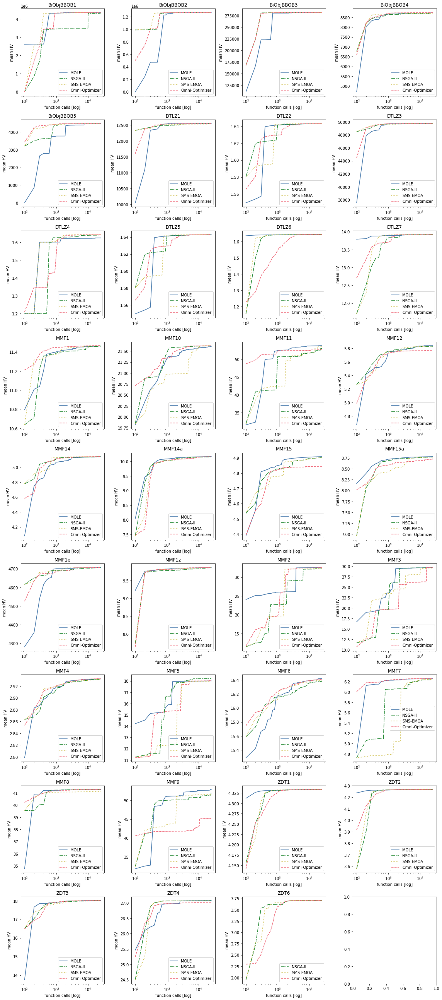

absec default


<Figure size 432x288 with 0 Axes>

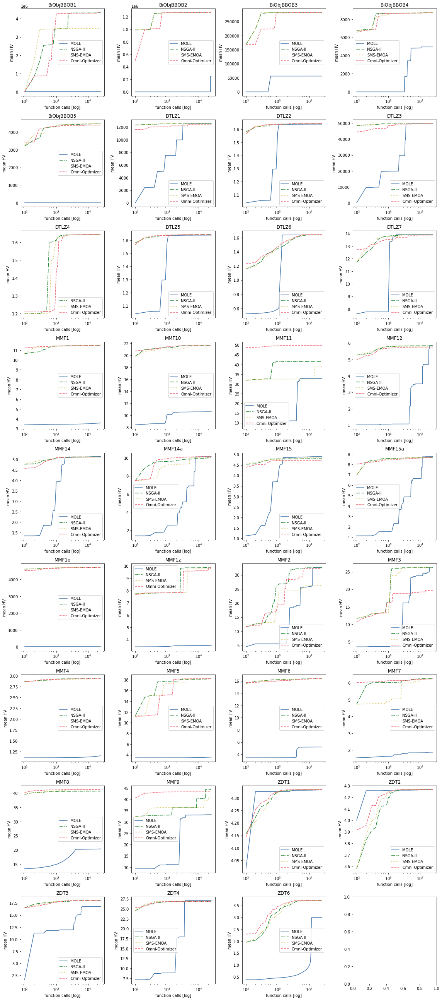

absec HVN


<Figure size 432x288 with 0 Axes>

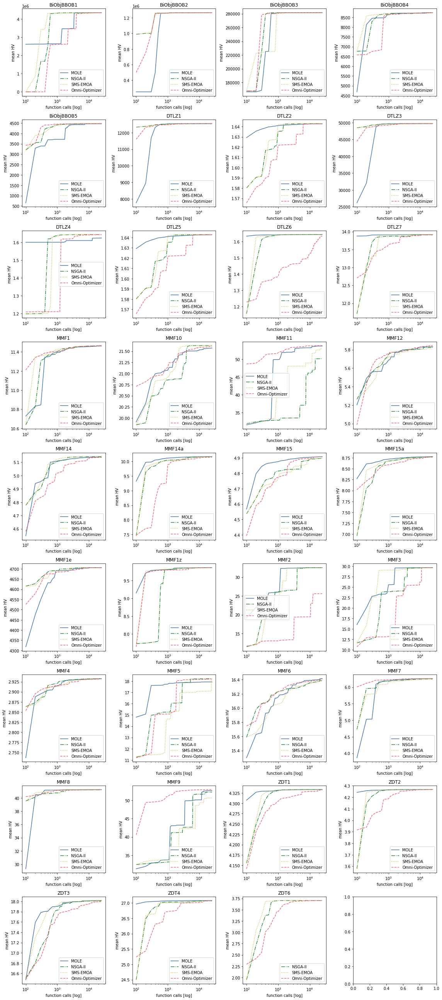

absec ABSECUMHVMEANNORM


<Figure size 432x288 with 0 Axes>

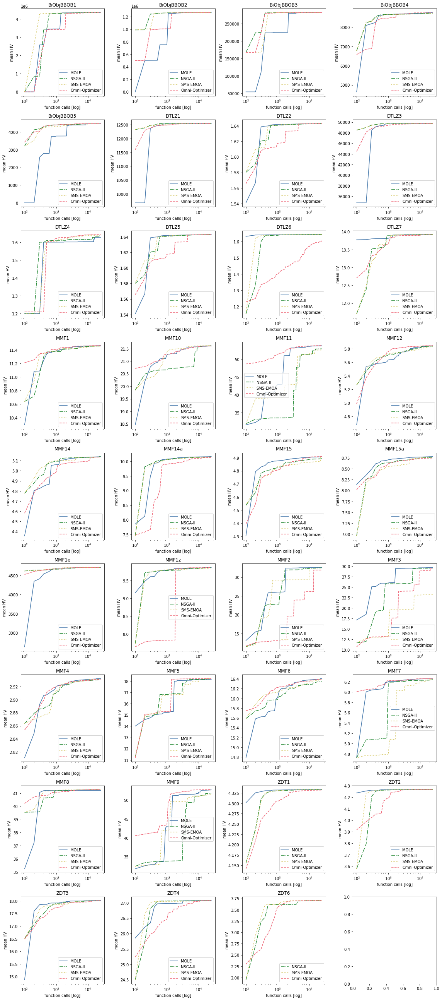

absec ABSEHVMEANNORM


<Figure size 432x288 with 0 Axes>

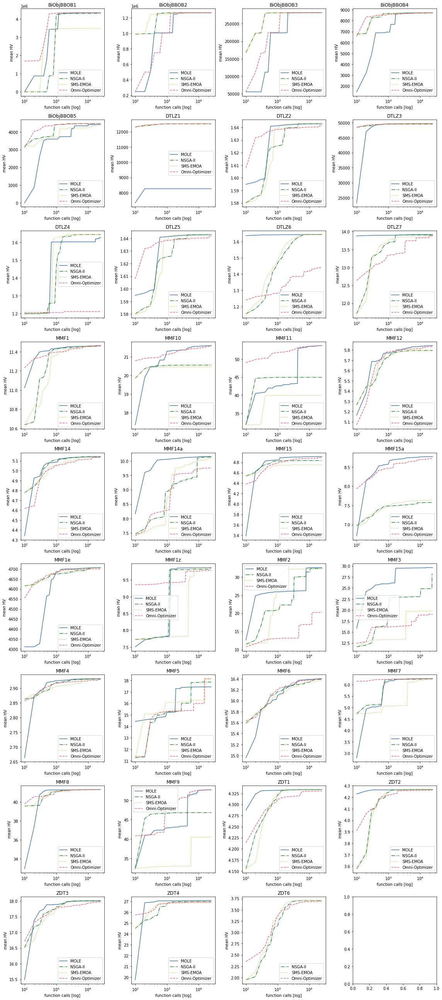

absec SP


<Figure size 432x288 with 0 Axes>

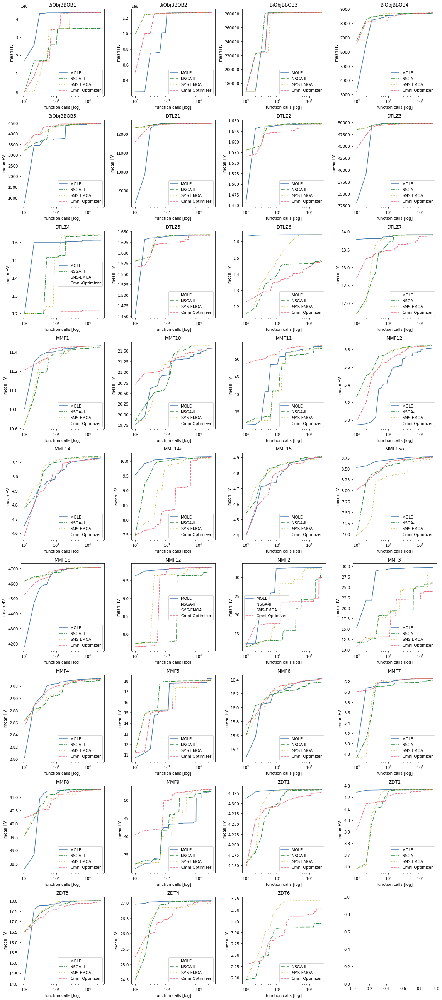

<Figure size 432x288 with 0 Axes>

In [89]:
for absetype, target in itertools.product(["abse","absec"], df["target"].unique()):
    print(absetype, target)
    
    width = 4
    height = int(np.ceil(len(df["instance"].unique())/width))

    fix, axs = plt.subplots(height, width, figsize=(4*width, 4*height))


    tdf = df[(df["type"]==absetype) & (df["target"]==target)]
    for figid, (instance, gdf) in enumerate(tdf.sort_values("instance").groupby("instance")):
        gdf = gdf.sort_values("solver")
        #print(f"{figid}, {instance}")
        i = figid // width
        j = figid % width
        ax = axs[i][j]
        #sns.lineplot(x="fun_calls", y="mean_value", hue="solver", ci=None, data=gdf, ax=ax)
        for solver, ggdf in gdf.groupby("solver"):
            ggdf = ggdf.sort_values("fun_calls")
            ax.plot(ggdf["fun_calls"], ggdf["mean_value"], **stylemap[solver])
        ax.set_xlabel("function calls [log]")
        ax.set_ylabel("mean HV")
        #ax.set_ylim(0, np.ceil(1.1*ggdf["mean_value"].max()))
        ax.legend()
        ax.set_xscale("log")
        ax.set_title(instance)
        
    fig.suptitle("ABSE mean per instance")
    plt.tight_layout()
    plt.savefig(f"figures/progtarget/{absetype}_{target}_mean_per_instance.pdf")
    plt.show()
    plt.clf()

BiObjBBOB1
BiObjBBOB2
BiObjBBOB3
BiObjBBOB4
BiObjBBOB5
DTLZ1
DTLZ2
DTLZ3
DTLZ4
DTLZ5
DTLZ6
DTLZ7
MMF1
MMF10
MMF11
MMF12
MMF14
MMF14a
MMF15
MMF15a
MMF1e


/var/folders/b8/41_wfv893tnc356wksp2vkvw0000gn/T/ipykernel_24391/4146712630.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fix, axs = plt.subplots(1, width, figsize=(4*width, 4*height))


MMF1z
MMF2
MMF3
MMF4
MMF5
MMF6
MMF7
MMF8
MMF9
ZDT1
ZDT2
ZDT3
ZDT4
ZDT6
BiObjBBOB1
BiObjBBOB2
BiObjBBOB3
BiObjBBOB4
BiObjBBOB5
DTLZ1
DTLZ2
DTLZ3
DTLZ4
DTLZ5
DTLZ6
DTLZ7
MMF1
MMF10
MMF11
MMF12
MMF14
MMF14a
MMF15
MMF15a
MMF1e
MMF1z
MMF2
MMF3
MMF4
MMF5
MMF6
MMF7
MMF8
MMF9
ZDT1
ZDT2
ZDT3
ZDT4
ZDT6


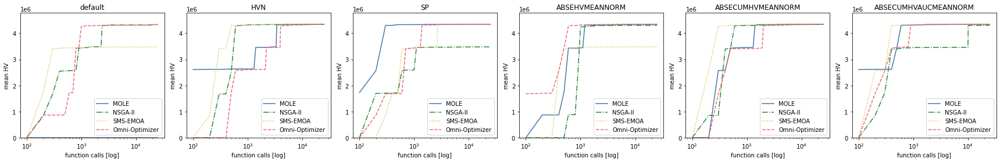

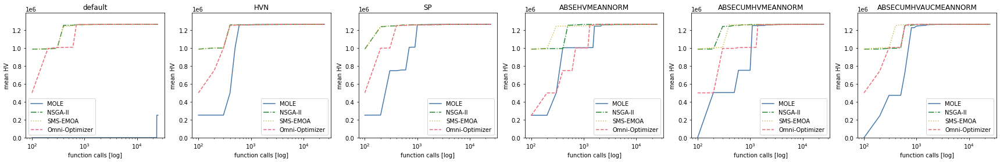

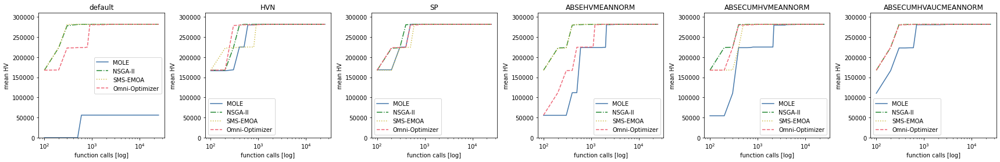

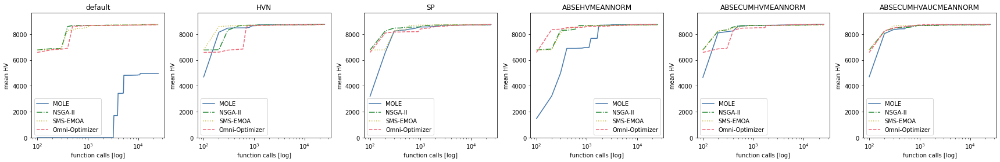

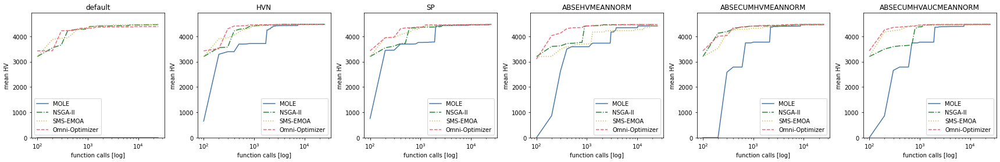

...

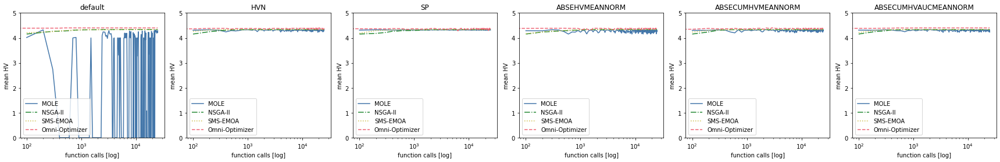

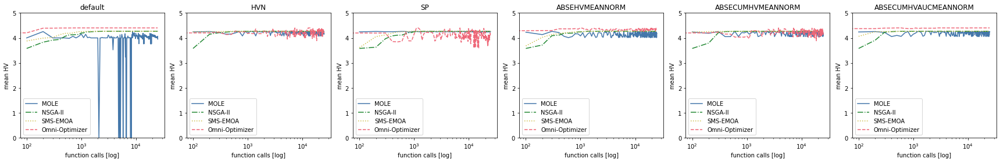

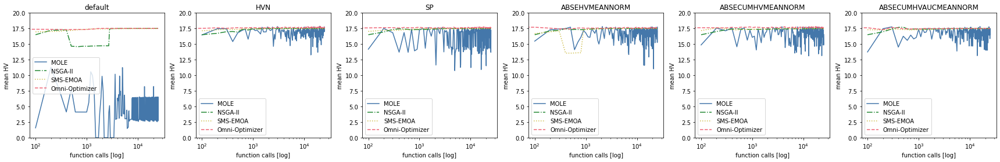

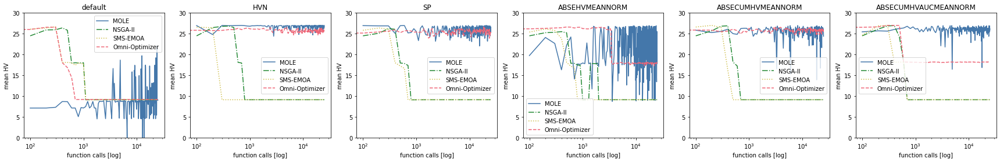

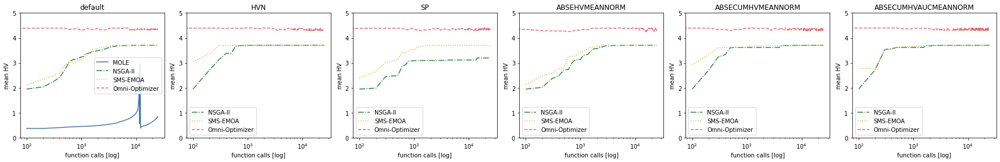

In [88]:
for absetype, instance in itertools.product(["absec","abse"], df["instance"].unique()):
    print(instance)
    
    width = len(df["target"].unique())
    height = 1
    fix, axs = plt.subplots(1, width, figsize=(4*width, 4*height))

    tdf = df[(df["type"]==absetype) & (df["instance"]==instance)]
    tdf = tdf.sort_values(["target","solver"])
    for figid, target in enumerate(config_order):
        target = target if target == "default" else target.replace("config-", "")
        gdf = tdf[tdf["target"] == target]
        gdf = gdf.sort_values("solver")
        #print(f"{figid}, {instance}")
        i = figid
        ax = axs[i]
        #sns.lineplot(x="fun_calls", y="mean_value", hue="solver", ci=None, data=gdf, ax=ax)
        for solver, ggdf in gdf.groupby("solver"):
            ggdf = ggdf.sort_values("fun_calls")
            ax.plot(ggdf["fun_calls"], ggdf["mean_value"], **stylemap[solver])
        ax.set_xlabel("function calls [log]")
        ax.set_ylabel("mean HV")
        ax.set_ylim(0, np.ceil(1.1*tdf["mean_value"].max()))
        ax.legend()
        ax.set_xscale("log")
        ax.set_title(target)

    fig.suptitle("ABSE mean per instance")
    plt.tight_layout()
    instancep = instance.replace(".pickle", "")
    plt.savefig(f"figures/proginstance/{instancep}_{absetype}_mean_per_instance.pdf")

# Efficient sets visualisation

In [21]:
for instance in df["instance"].unique():
    print(instance)
    result = load_rdata(f"visualisation/{instance}_NSGA-II.Rdata")
    
    print("Efficient sets: {}".format(len(result["abse"]["efficientSets"])))
    #for label in np.unique(result["abse"]["decSpaceLabels"]):
    #    print(label, np.count_nonzero(result["abse"]["decSpaceLabels"] == label))
    
    fig, (decplt, objplt) = plt.subplots(1,2, figsize=(10,5))
    for efficient_set in result["abse"]["efficientSets"][:5]:
        dec = np.array([result["abse"]["dec.space"][int(point-1),:] for point in efficient_set])
        decplt.scatter(*dec.T, alpha=0.3)
        obj = np.array([result["abse"]["obj.space"][int(point-1),:] for point in efficient_set])
        objplt.scatter(*obj.T, alpha=0.3)
    fig.suptitle(instance + " - efficient sets: {}".format(len(result["abse"]["efficientSets"])))
    plt.savefig(f"figures/efficientsets/{instance}.pdf")
    plt.show()

BiObjBBOB1.pickle


NameError: name 'load_rdata' is not defined